Using Xlense from FieldLensing with HealpixTransforms
==========

Load modules
----------

In [1]:
using XFields
using HealpixTransforms
using FieldLensing
using Spectra

using SparseArrays
using LinearAlgebra
using LBblocks: @sblock
using PyPlot
using BenchmarkTools

┌ Info: Precompiling HealpixTransforms [87ff4591-92fd-4060-b5b1-4df480ce5401]
└ @ Base loading.jl:1323


Type alias
--------------

In [2]:
const F64 = Float64
const C64 = Complex{F64}
const FL  = FieldLensing
const HT  = HealpixTransforms

HealpixTransforms

Simulate a mock CMB temp field and a lensing potential on the sphere
===========================

Set fourier grid parameters
--------------------------

In [3]:
trn = let nside = 1024 # 512 # 1024 # 2048
    ℍ0(nside, iter=1)
end

ℍ0(1024, 3071, 1)

Compute the spectral matrices which mimic CMB tempurature and lesing potential
---------------------------

In [4]:
Ct, Cϕ = @sblock let trn
    l, m = lm(trn)

    cϕl = Spectra.cϕl_approx.(l)
    cϕl[l .< 2] .= 0

    cTl = Spectra.cTl_approx.(l)
    #cTl = Spectra.cTl_besselj_approx.(l)
    #cTl = Spectra.cTl_matern_cov_approx.(l)
    cTl .*= Spectra.knee.(l; ell=50, alpha=2)
    cTl[l .< 2] .= 0

    Ct  = DiagOp(Xfourier(trn, cTl))
    Cϕ  = DiagOp(Xfourier(trn, cϕl))

    Ct, Cϕ
end;

Simulate and compute two vectorfields from phi
------------------------

In [5]:
T, ϕ = @sblock let trn, Ct, Cϕ
    zTlm = randn(eltype_out(trn),size_out(trn))
    zϕlm = randn(eltype_out(trn),size_out(trn))

    T = √Ct * Xfourier(trn, zTlm)
    ϕ = √Cϕ * Xfourier(trn, zϕlm)

    T, ϕ
end;

In [6]:
vϕ_on_ê, vϕ_on_eθφ = let trn=trn, ϕ=ϕ
    ∇θf, sinθ⁻¹∇φf = HT.∇(ϕ[!], trn)[1:2]
    sinθ = sin.(pix(trn)[1])
    vϕ_on_ê = (Xmap(trn,∇θf), Xmap(trn, sinθ⁻¹∇φf))
    vϕ_on_eθφ = (Xmap(trn,∇θf), Xmap(trn, sinθ⁻¹∇φf ./ sinθ))
    vϕ_on_ê, vϕ_on_eθφ
end;

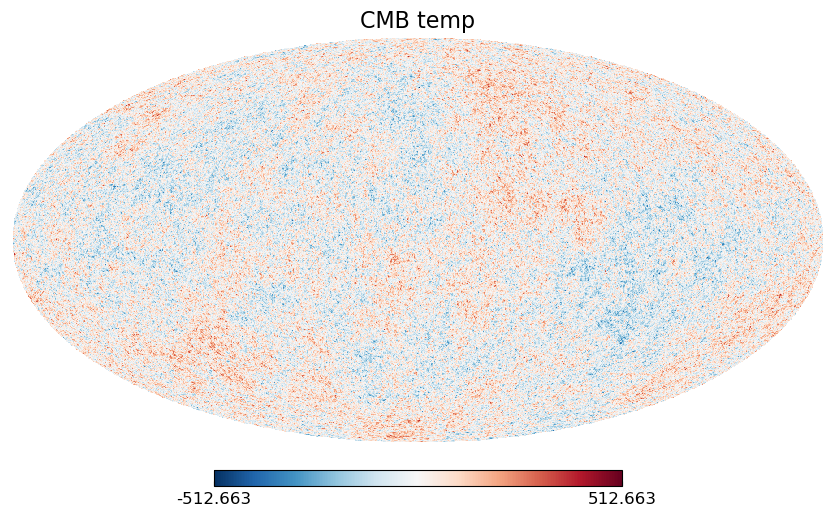

In [7]:
HT.mollview(T[:], title="CMB temp")

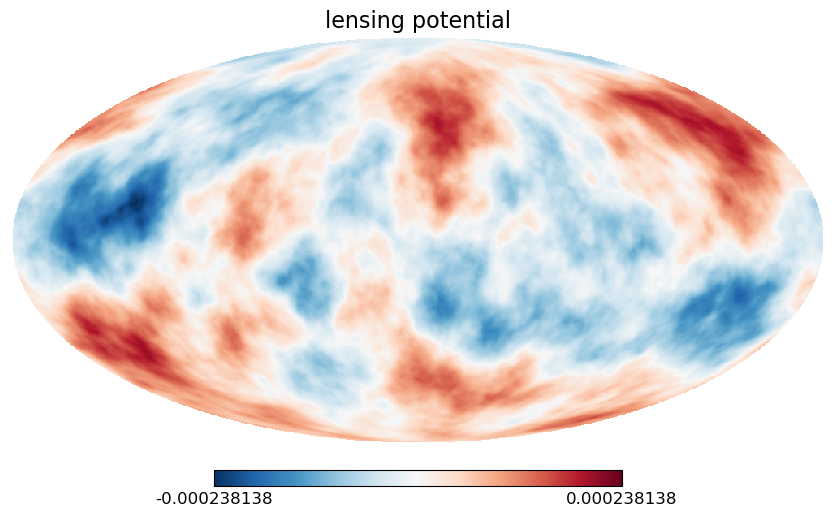

In [8]:
HT.mollview(ϕ[:], title="lensing potential")

Testing interp of gradients on sphere for lensing
====================

In [9]:
θfull, φfull  = pix(trn)
smallθ = (θfull .< 0.025)
midθ   = (π/2-0.01) .< θfull .< (π/2+0.01)
v1_eθφ   = vϕ_on_eθφ[1][:]
v2_eθφ   = vϕ_on_eθφ[2][:]
v1_ê   = vϕ_on_ê[1][:]
v2_ê   = vϕ_on_ê[2][:];

The geodesic distance of displacement should be the similar
for all θ

In [10]:
displ_geo = function (v1, v2)
    initn̂ = HT.n̂.(θfull,φfull)
    termn̂ = HT.n̂.(θfull .+ v1, φfull .+ v2)
    .- log.(HT.α_n̂.(initn̂, termn̂))
end

#2 (generic function with 1 method)

Test vϕ_on_ê
---------------------

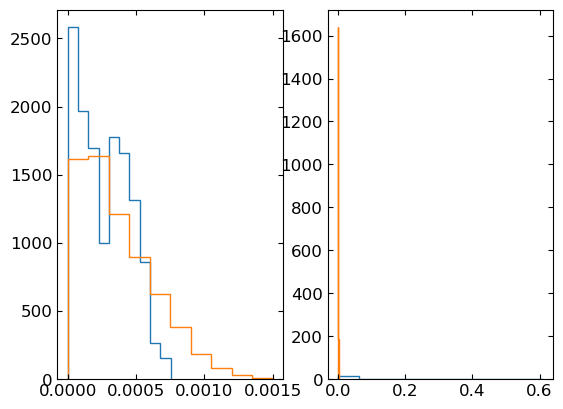

([1617.6929564506786, 1639.338550879495, 1214.097188484256, 896.4008061758785, 623.6768239429058, 379.3232810098371, 186.19414236826393, 78.6491622814025, 29.263582759346157, 6.409617767756259], [4.669443770072438e-9, 0.00014990619660953505, 0.0002998077237753, 0.00044970925094106503, 0.00059961077810683, 0.000749512305272595, 0.00089941383243836, 0.0010493153596041248, 0.0011992168867698899, 0.001349118413935655, 0.0014990199411014198], PyCall.PyObject[PyObject <matplotlib.patches.Polygon object at 0x7fbc004a94d0>])

In [11]:
fig, ax = subplots(1,2)
ax[1].hist(abs.(v2_ê[smallθ]), histtype="step", density=true)
ax[1].hist(abs.(v2_ê[midθ]),   histtype="step", density=true)
ax[2].hist(abs.(v2_eθφ[smallθ]), histtype="step", density=true)
ax[2].hist(abs.(v2_eθφ[midθ]),   histtype="step", density=true)

these look to have the same magnitude if using raw HT.∇
... which seems to imply that vϕ_on_ê are indeed weights on êθ and êφ

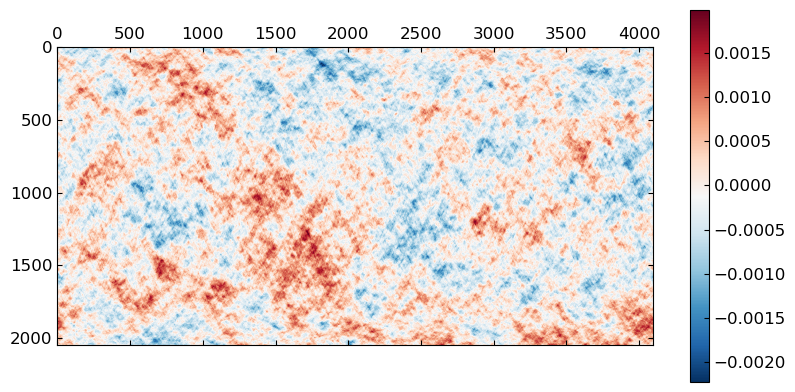

In [12]:
v1_ê |> HT.eqbelt |> matshow; colorbar();

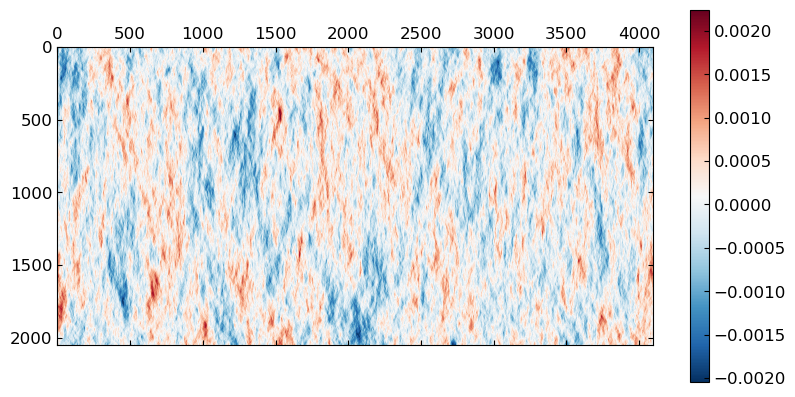

In [13]:
v2_ê |> HT.eqbelt |> matshow; colorbar();

Test vϕ_on_eθφ
---------------------

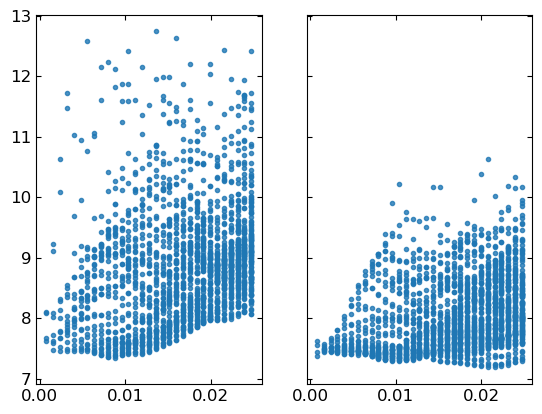

1-element Vector{PyCall.PyObject}:
 PyObject <matplotlib.lines.Line2D object at 0x7fbc5b985510>

In [14]:
fig, ax = subplots(1,2, sharey=true)
displ_geo_ê   = displ_geo(v1_ê, v2_ê)
displ_geo_eθφ = displ_geo(v1_eθφ, v2_eθφ)
ax[1].plot(θfull[smallθ], displ_geo_ê[smallθ], ".", alpha = 0.8)
ax[2].plot(θfull[smallθ], displ_geo_eθφ[smallθ], ".", alpha = 0.8)

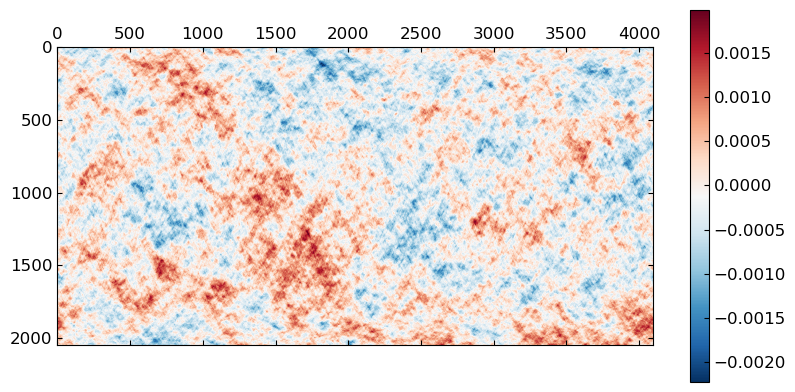

In [15]:
v1_eθφ |> HT.eqbelt |> matshow; colorbar();

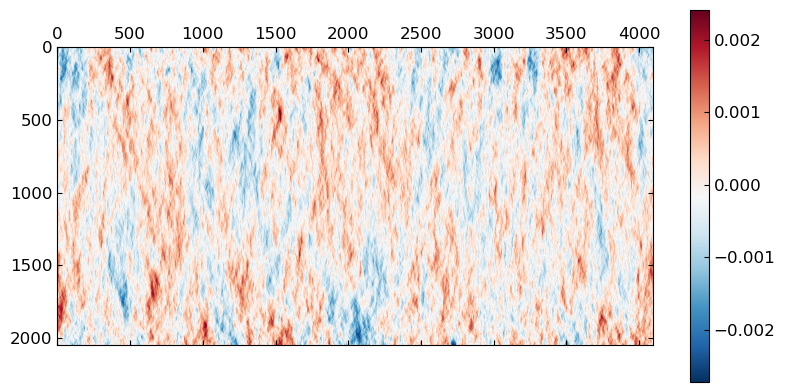

In [16]:
v2_eθφ |> HT.eqbelt |> matshow; colorbar();

Lets check that we can get the same vϕ_on_ê, vϕ_on_eθφ on the
equitorial belt with discrete increments
====================

In [17]:
Tbelt = HT.eqbelt(T[:])
ϕbelt = HT.eqbelt(ϕ[:]);

In [18]:
v1_eθφ_belt  = HT.eqbelt(vϕ_on_eθφ[1][:])
v2_eθφ_belt  = HT.eqbelt(vϕ_on_eθφ[2][:])
v1_ê_belt  = HT.eqbelt(vϕ_on_ê[1][:])
v2_ê_belt  = HT.eqbelt(vϕ_on_ê[2][:]);

In [19]:
θbelt, φbelt = HT.pix_eqbelt(trn.nside)
sinθbelt = sin.(θbelt)
Δcosθ    = mean(diff(cos.(θbelt)))
nθ       = length(θbelt)
Δφ       = mean(diff(φbelt[:]))
nφ       = length(φbelt)
onesnφm1 = fill(1,nφ-1);

∂θ (action by left mult)

 for healpix on the equitorial belt, cos(θ) is on an even grid.

In [20]:
onesnθm1 = fill(1,nθ-1)
∂cosθ = (1 / (2Δcosθ)) * spdiagm(-1 => .-onesnθm1, 1 => onesnθm1)
∂θ = (.- sinθbelt) .* ∂cosθ # using the chain rule and -sin(θ) = (d/dθ) cosθ
∂θ[1,:] .= 0
∂θ[end,:] .= 0;

∂φᵀ (action by right mult)

In [21]:
∂φ      = spdiagm(-1 => .-onesnφm1, 1 => onesnφm1)
# for the periodic boundary conditions
∂φ[1,end] = -1
∂φ[end,1] =  1
# now as a right operator
∂φᵀ = transpose((1 / (2Δφ)) * ∂φ);
# (∂φ * f')' == ∂/∂φ f == f * ∂φᵀ

Apply these to the phi realization
----------------------------

In [22]:
∂θϕ = ∂θ * ϕbelt
∂φϕ = ϕbelt * ∂φᵀ

test_v1_eθφ_belt = ∂θϕ
test_v2_eθφ_belt = ∂φϕ ./ abs2.(sinθbelt)
test_v1_ê_belt   = ∂θϕ
test_v2_ê_belt   = ∂φϕ ./ sinθbelt;

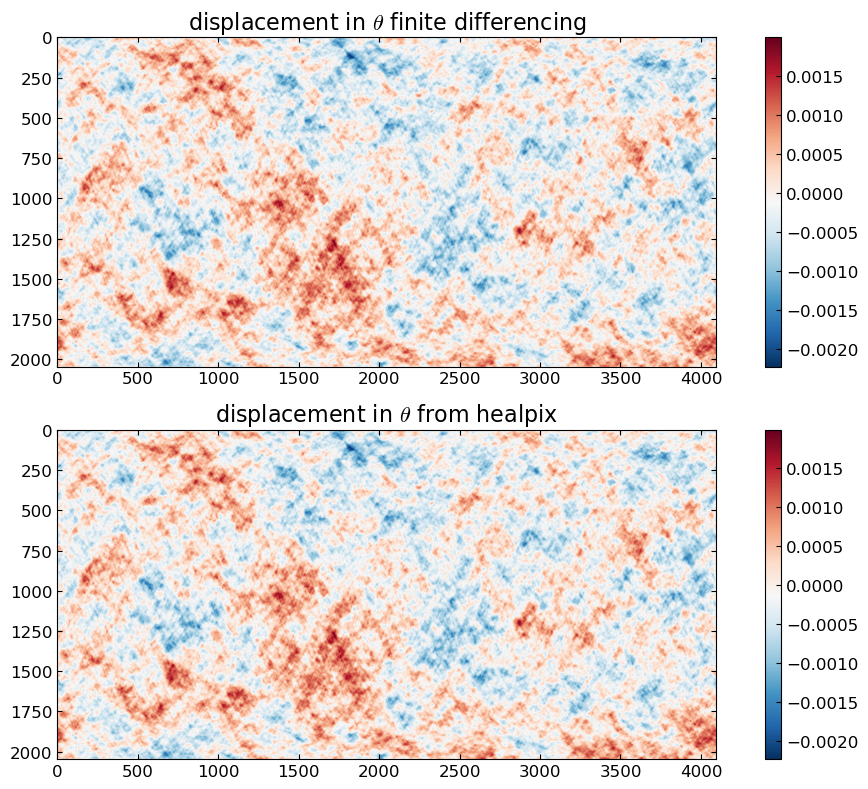

In [23]:
fig, ax = subplots(2,1, figsize=(10,8))
pcm1 = ax[1].imshow(test_v1_eθφ_belt)
pcm2 = ax[2].imshow(v1_eθφ_belt)
ax[1].set_title(L"displacement in $\theta$ finite differencing")
ax[2].set_title(L"displacement in $\theta$ from healpix")
fig.colorbar(pcm1, ax = ax[1])
fig.colorbar(pcm2, ax = ax[2])
fig.tight_layout()

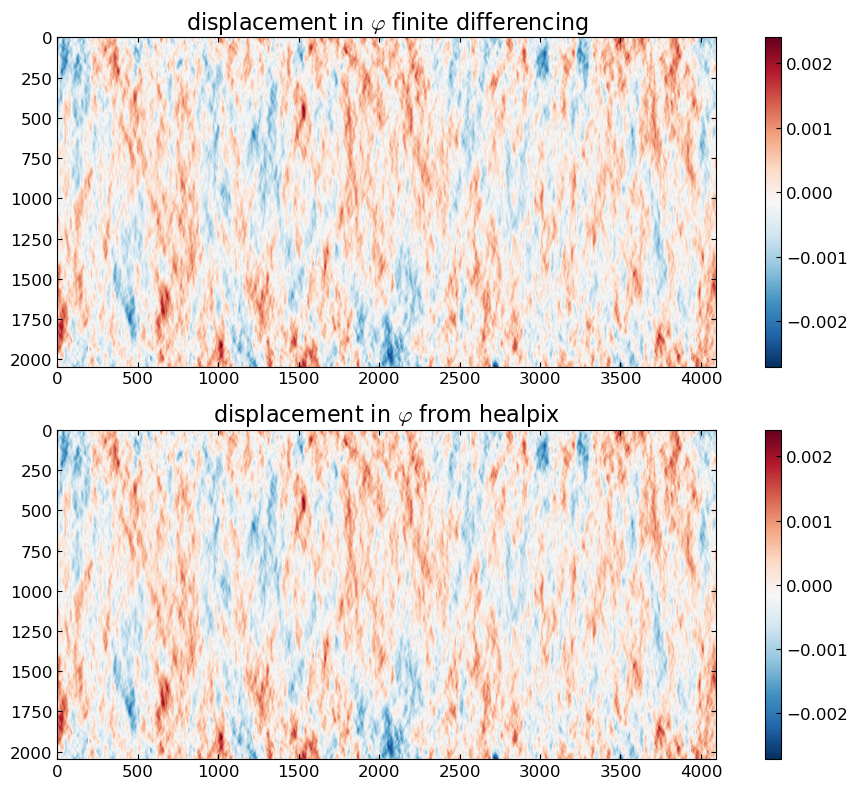

In [24]:
fig, ax = subplots(2,1, figsize=(10,8))
pcm1 = ax[1].imshow(test_v2_eθφ_belt)
pcm2 = ax[2].imshow(v2_eθφ_belt)
ax[1].set_title(L"displacement in $\varphi$ finite differencing")
ax[2].set_title(L"displacement in $\varphi$ from healpix")
fig.colorbar(pcm1, ax = ax[1])
fig.colorbar(pcm2, ax = ax[2])
fig.tight_layout()

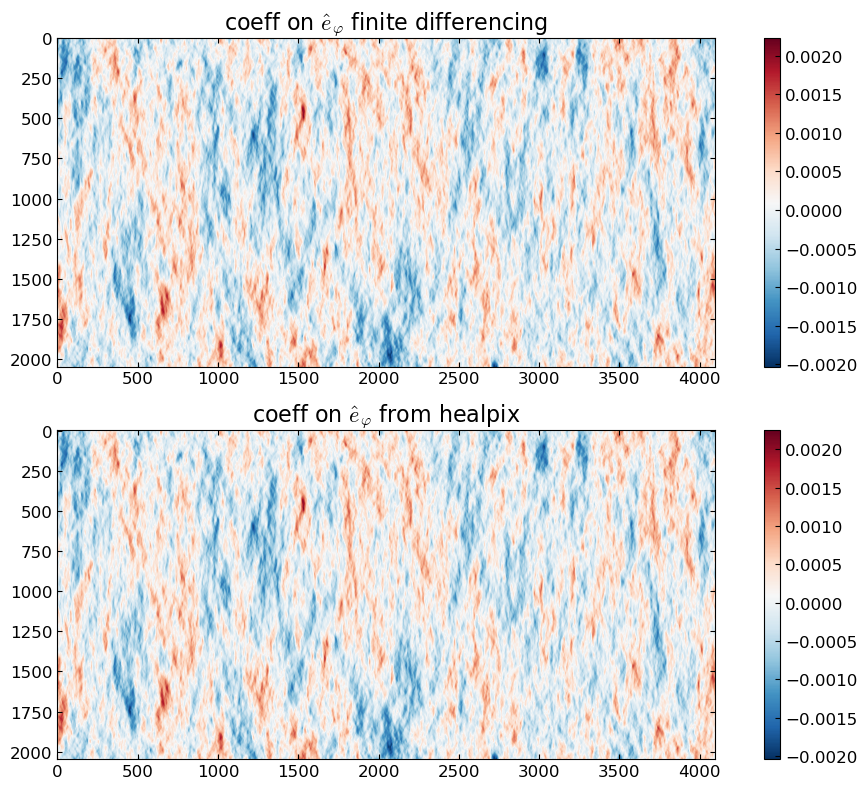

In [25]:
fig, ax = subplots(2,1, figsize=(10,8))
pcm1 = ax[1].imshow(test_v2_ê_belt)
pcm2 = ax[2].imshow(v2_ê_belt)
ax[1].set_title(L"coeff on $\hat e_{\varphi}$ finite differencing")
ax[2].set_title(L"coeff on $\hat e_{\varphi}$ from healpix")
fig.colorbar(pcm1, ax = ax[1])
fig.colorbar(pcm2, ax = ax[2])
fig.tight_layout()

Lensing two ways: full sphere with Xlense; equitorial belt with ArrayLense
======================================

Equitorial belt with ArrayLense
======================================
To use ArrayLense we just need to define ∇!

In [26]:
struct Nabla!{Tθ,Tφ}
    ∂θ::Tθ
    ∂φᵀ::Tφ
end

function (∇!::Nabla!{Tθ,Tφ})(∇y::NTuple{2,A}, y::A) where {Tθ,Tφ,Tf,A<:Array{Tf,2}}
    mul!(∇y[1], ∇!.∂θ, y)
    mul!(∇y[2], y, ∇!.∂φᵀ)
    ∇y
end

belt displacement field

In [27]:
### The following leads to some systematics at the edges
# vϕbelt = @sblock let ϕ, ∂θ, ∂φᵀ, sinθbelt
#     ϕbelt = HT.eqbelt(ϕ[:])
#     ∂θϕ = ∂θ * ϕbelt
#     ∂φϕ = ϕbelt * ∂φᵀ
#     v1_eθφ_belt = ∂θϕ
#     v2_eθφ_belt = ∂φϕ ./ abs2.(sinθbelt)
#     (v1_eθφ_belt, v2_eθφ_belt)
# end

vϕbelt = @sblock let vϕ_on_eθφ
    (HT.eqbelt(vϕ_on_eθφ[1][:]), HT.eqbelt(vϕ_on_eθφ[2][:]))
end

([-0.00019206773922594484 -0.00022261065469174264 … -0.00014249860136999136 -0.0001664723634460714; -0.00016145272424162525 -0.00017275280131001162 … -0.00014750480328412305 -0.00015243700117239026; … ; 0.0003418930666142908 0.00034839495545732786 … 0.0002890199343989975 0.00032037581395053205; 0.000308205916365632 0.0003061495720675608 … 0.0002829930664711945 0.00030144337714822604], [-0.0016877950220873226 -0.001667811081283229 … -0.0016107505073136986 -0.0016743468063786103; -0.0017029667984840655 -0.0016917398639827378 … -0.001620288492897107 -0.001689150855604176; … ; 0.00018769005977725884 0.00013386297592166206 … 0.00031305394782875086 0.00025389527202473316; 0.00019460490776896153 0.00013307332319681636 … 0.00034221744643714405 0.00027550813892191135])

Now construct the lense

In [28]:
L = @sblock let v=vϕbelt, ∂θ, ∂φᵀ,  ∇! = Nabla!(∂θ, ∂φᵀ), nsteps=16,
    t₀ = 0
    t₁ = 1
    FL.ArrayLense(v, ∇!, t₀, t₁, nsteps)
end;

In [29]:
@time lenTbelt = L * Tbelt

 15.052194 seconds (12.34 M allocations: 1.792 GiB, 1.25% gc time)


2047×4096 Matrix{Float64}:
  -13.6522    -37.9345    -85.669   …  -130.982   -118.707    -41.1949
  -23.5145    -51.6847    -96.1972     -103.165   -116.66     -56.0289
  -44.2762    -83.737    -124.204       -63.1166   -91.6408   -60.8412
  -73.114    -115.004    -157.833       -40.4011   -76.003    -77.2063
  -78.2588   -114.251    -166.671       -45.0557   -87.872    -87.1466
  -75.3027   -110.023    -158.096   …   -81.0518  -118.551    -98.895
  -79.2811   -113.646    -148.43       -131.251   -156.73    -111.211
  -78.518    -110.311    -136.179      -167.831   -174.482   -112.759
 -106.038    -120.602    -130.096      -191.647   -191.196   -136.067
 -120.937    -121.166    -120.544      -190.259   -194.926   -147.616
  -82.6523    -82.2907    -93.3801  …  -179.137   -171.092   -124.929
  -52.58      -33.629     -63.3325     -176.768   -147.129   -109.975
  -41.9619    -18.6311    -52.3668     -161.939   -108.828    -92.4298
    ⋮                               ⋱                    

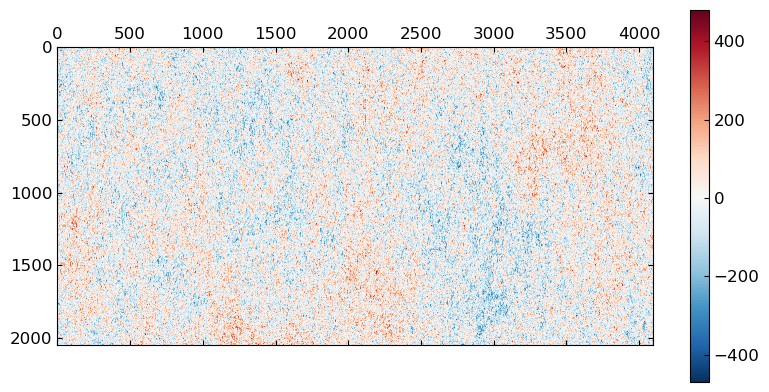

In [30]:
lenTbelt |> matshow; colorbar();

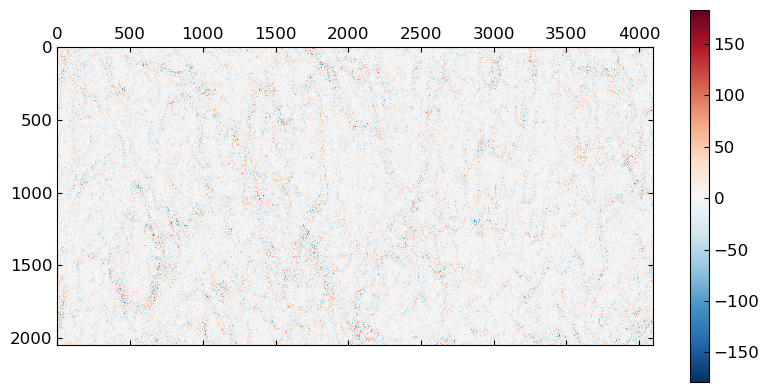

In [31]:
(lenTbelt .- Tbelt) |> matshow; colorbar();

### Inverse Lense

In [32]:
@time Tbelt′ = L \ lenTbelt

  8.168512 seconds (7.94 k allocations: 1.125 GiB, 0.92% gc time)


2047×4096 Matrix{Float64}:
  -36.1639    -80.7756   -112.336    …  -113.903    -60.9059    -2.77209
  -49.2296    -99.467    -120.791       -104.932    -78.1615   -22.1113
  -79.5837   -128.713    -134.603        -75.7702   -80.7922   -49.0672
 -108.053    -156.437    -158.689        -63.1672   -92.0717   -82.5305
 -105.637    -154.358    -158.881        -79.1395  -104.965    -83.6477
  -97.2272   -146.123    -142.014    …  -120.974   -120.309    -79.4416
  -98.9158   -142.405    -132.917       -163.974   -137.311    -79.3063
  -98.5985   -135.24     -133.163       -182.148   -143.453    -82.774
 -114.016    -129.143    -128.603       -194.781   -164.18    -112.498
 -100.822    -109.197    -108.95        -184.014   -157.166   -108.551
  -45.6287    -68.3403    -83.2853   …  -156.118   -120.523    -72.3492
  -15.8716    -32.783     -64.0544      -132.129    -96.5534   -62.0026
  -20.7381    -34.8986    -54.2589      -108.332    -70.5732   -58.5765
    ⋮                                ⋱ 

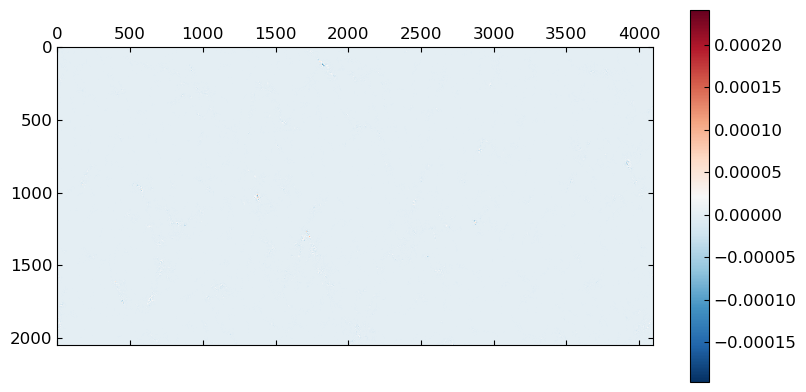

In [33]:
(Tbelt′ .- Tbelt) |> matshow; colorbar();

Full sphere with Xlense
======================================
To use Xlense we need to define FL.plan and FL.gradient!

In [34]:
let sinθ = sin.(pix(trn)[1])

    # for ℍ0 we have Xlense{2,...,1} since it's a 2 dimensional field, stored in 1-d Array
    function FL.plan(L::Xlense{2,ℍ0,Tf,Ti,1}) where {Tf<:F64, Ti<:C64}
        szf, szi =  size_in(L.trn), size_out(L.trn)
        k     = lm(L.trn)
        vx    = tuple(L.v[1][:], L.v[2][:])

        ∇v1x = HT.∇(L.v[1][!], L.trn)[1:2]
        ∇v2x = HT.∇(L.v[2][!], L.trn)[1:2]
        ∂vx = Array{Tf,1}[Array{Tf,1}(undef,szf) for r=1:2, c=1:2]
        ∂vx[1,1] .= ∇v1x[1]
        ∂vx[2,1] .= ∇v2x[1]
        ∂vx[1,2] .= sinθ.*∇v1x[2] # extra sinθ to get d/dφ
        ∂vx[2,2] .= sinθ.*∇v2x[2] # extra sinθ to get d/dφ

        mx  = deepcopy(∂vx)
        px  = deepcopy(vx)
        ∇y  = deepcopy(vx)
        sk  = zeros(C64,szi)
        yk  = zeros(C64,szi)
        FL.XlensePlan{2,ℍ0,Tf,Ti,1}(L.trn,k,vx,∂vx,mx,px,∇y,sk,yk)
    end

    function FL.gradient!(∇y::NTuple{2,Array{F64,1}}, y::Array{F64,1}, Lp::FL.XlensePlan{2,ℍ0,F64,C64,1})
        f = Xmap(Lp.trn, y)
        ∇θf, sinθ⁻¹∇φf = HT.∇(f[!], Lp.trn)[1:2]
        ∇y[1] .= ∇θf
        ∇y[2] .= sinθ .* sinθ⁻¹∇φf
    end

end

... do the one for

Construct lense
---------------

Now construct the lense

In [35]:
L = @sblock let trn, vϕ=vϕ_on_eθφ, nsteps=16
    t₀ = 0
    t₁ = 1
    FL.Xlense(trn, vϕ, t₀, t₁, nsteps)
end;

Forward lensing
---------------

In [36]:
@time lenT = L * T;

298.864993 seconds (2.76 M allocations: 44.051 GiB, 3.19% gc time)


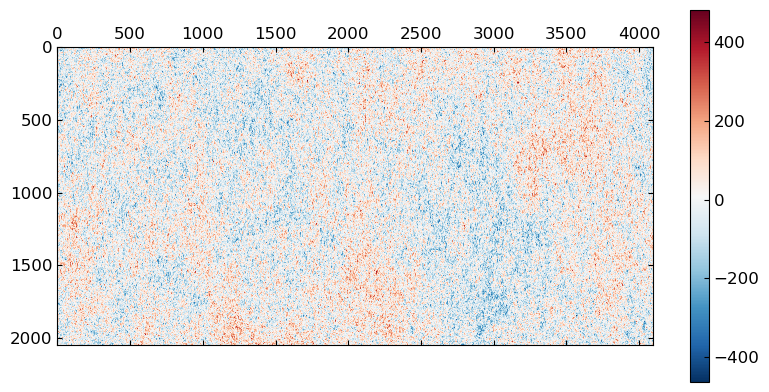

In [37]:
lenT[:] |> HT.eqbelt |> matshow; colorbar();

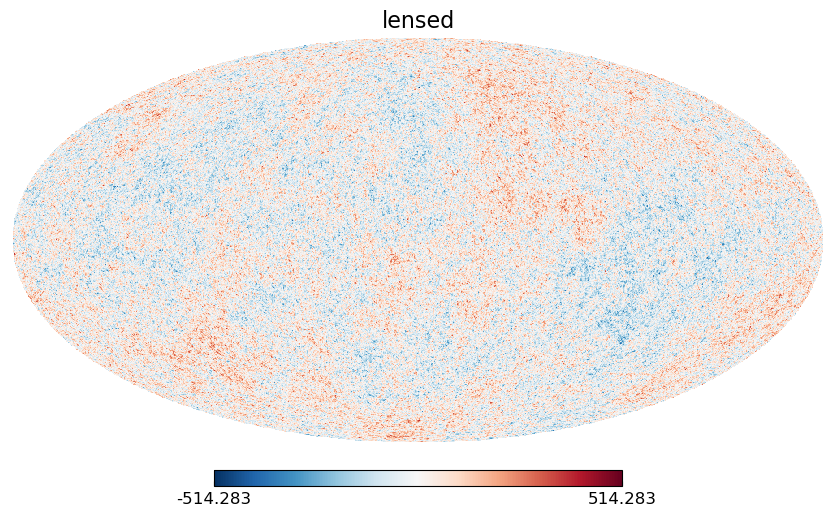

In [38]:
HT.mollview(lenT[:], title="lensed")

Difference between lensed and un-lensed

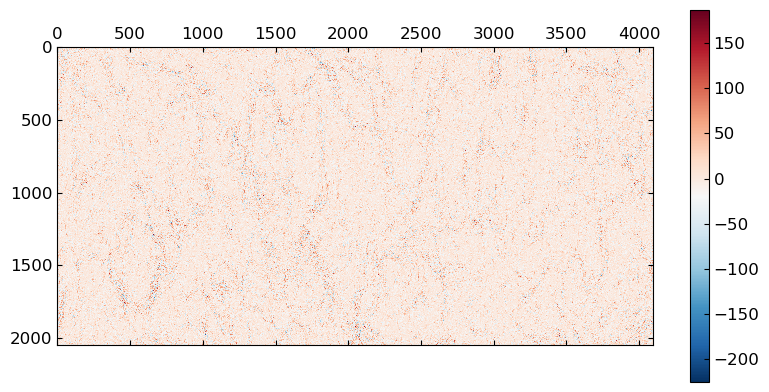

In [39]:
(T - lenT)[:] |> HT.eqbelt |> matshow; colorbar();

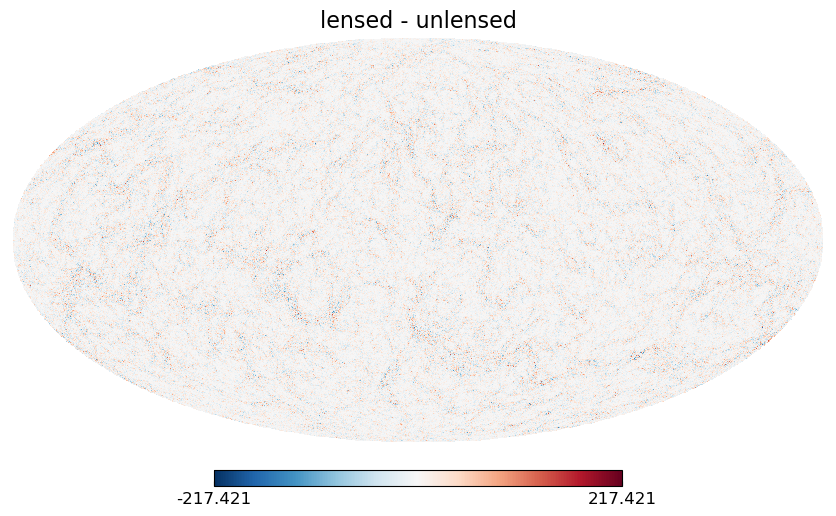

In [40]:
HT.mollview((T - lenT)[:], title="lensed - unlensed")

Inverse lensing
---------------

In [41]:
@time T′ = L \ lenT;

301.155435 seconds (19.88 k allocations: 43.901 GiB, 3.08% gc time)


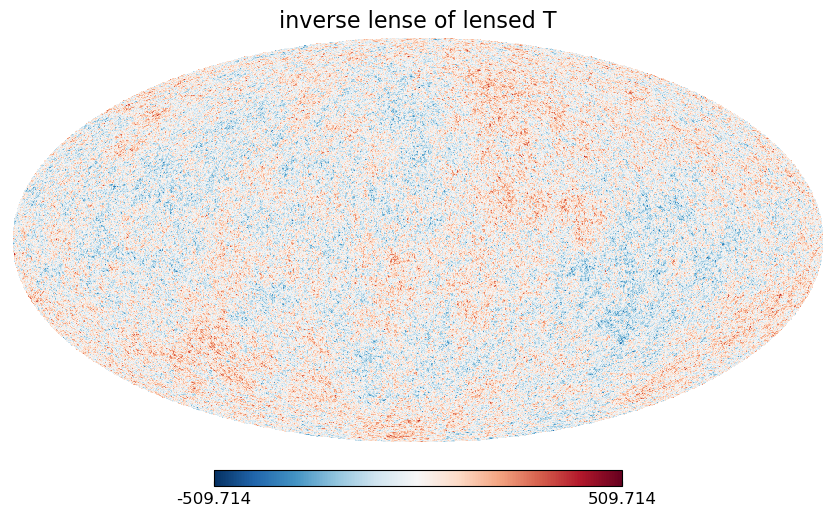

In [42]:
HT.mollview(T′[:], title="inverse lense of lensed T")

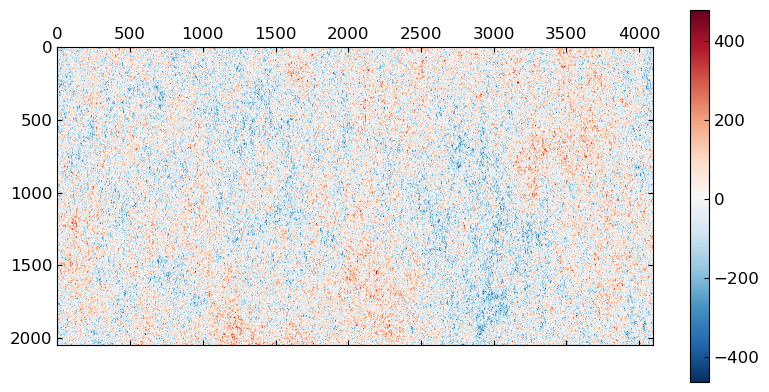

In [43]:
T′[:] |> HT.eqbelt |> matshow; colorbar();

Difference between lensed and un-lensed

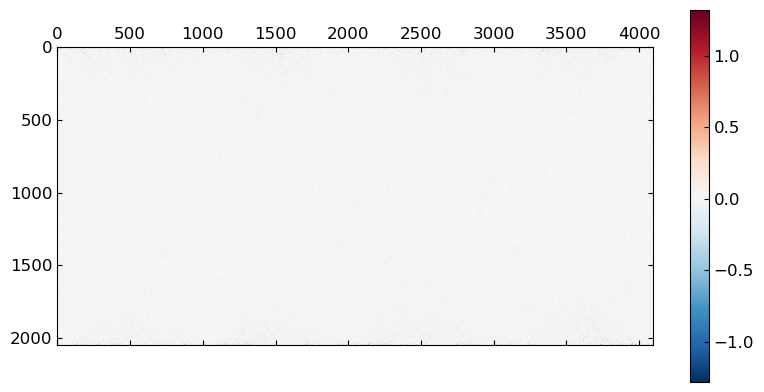

In [44]:
(T - T′)[:] |> HT.eqbelt |> matshow; colorbar();

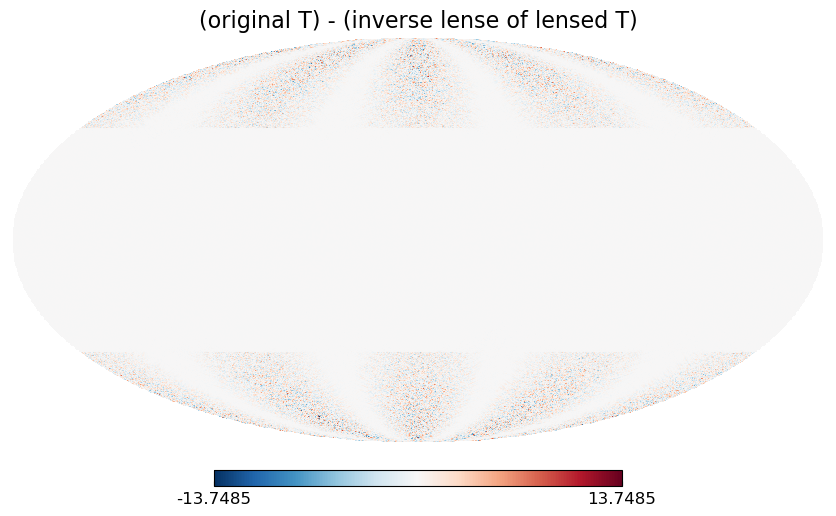

In [45]:
HT.mollview((T - T′)[:], title="(original T) - (inverse lense of lensed T)")

Compare Equitorial belt lense to full sky lense
======================================

Here is the lensing of the eqbelt

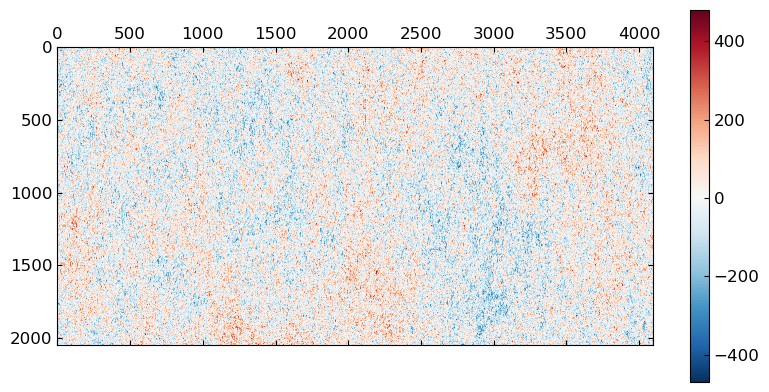

In [46]:
lenTbelt |> matshow; colorbar();

Here is the equitorial belt of the full sky lense

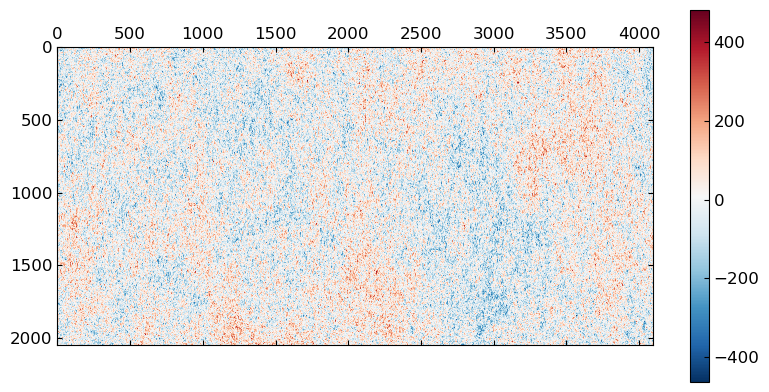

In [47]:
beltlenT = HT.eqbelt(lenT[:]);
beltlenT |> matshow; colorbar();

Here is the difference between the two

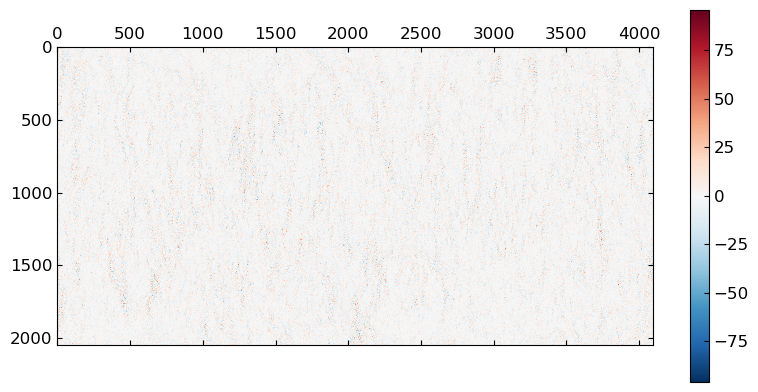

In [48]:
(lenTbelt .- beltlenT) |> matshow; colorbar();